<a href="https://colab.research.google.com/github/Nandakishore385/Animated-Story-Video-Generator/blob/main/Animated_Story.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%pip install google-genai

In [ ]:
import google.generativeai as genai

In [ ]:
from google.colab import userdata
import os

os.environ['GOOGLE_API_KEY'] = userdata.get('GOOGLE_API_KEY')

In [ ]:
!apt-get update -qq && apt-get install -qq locales
!locale-gen en_US.UTF-8
!update-locale LANG=en_US.UTF-8 LC_ALL=en_US.UTF-8

!apt-get -qq -y install espeak-ng > /dev/null 2>&1
%pip install -q google-generativeai moviepy Pillow
%pip install -q nest_asyncio

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Generating locales (this might take a while)...
  en_US.UTF-8... done
Generation complete.


In [ ]:
#Core Data Processing
import os
import json
import numpy as np
from io import BytesIO

#Image Handling
from PIL import Image
from IPython.display import display


#For Video & Audio
from moviepy.editor import ImageClip, AudioFileClip, CompositeVideoClip, concatenate_videoclips

import time
from IPython.display import HTML
from base64 import b64encode

import typing_extensions as typing


#async support
import nest_asyncio
nest_asyncio.apply()
import asyncio
import contextlib
import wave


#Google GenAI
from google import genai

  if event.key is 'enter':



In [ ]:
from google import genai
client = genai.Client(http_options = {
    'api_version':'v1alpha'
})

MODEL = "models/gemini-2.0-flash-exp"

IMAGE_MODEL_ID = "imagen-3.0-generate-002"

In [ ]:
class StorySegment(typing.TypedDict):
  image_prompt: str
  audio_text: str
  character_description:str


class StoryResponse(typing.TypedDict):
  complete_story: list[StorySegment]
  pages:int

def generate_story_sequence(complete_story:str, pages:int) -> list[StoryResponse]:
  response = client.models.generate_content(
      model=MODEL,
      contents=f'''you are an animation video producer. Generate a story sequence about {complete_story} in {pages} scenes (with interactions and characters), 1 sec each scene. Write:

image_prompt:(define art style for kids animation(consistent for all the characters), no violence) a full description of the scene, the characters in it, and the background in 20 words or less. Progressively shift the scene as the story advances.
audio_text: a one-sentence dialogue/narration for the scene.
character_description: no people ever, only animals and objects. Describe all characters (consistent names, features, clothing, etc.) with an art style reference (e.g., "Pixar style," "photorealistic," "Ghibli") in 30 words or less.
''',
      config={
          'response_mime_type':'application/json',
          'response_schema': list[StoryResponse]
      }
  )
  try:
    story_data_text = response.text
    story_data_list = json.loads(story_data_text)
    if isinstance(story_data_list,list) and len(story_data_list)>0:
      story_data = story_data_list[0]
      return story_data.get('complete_story',[]),story_data.get('character_description',{})
    else:
      return[]
  except (KeyError, TypeError, IndexError, json.JSONDecodeError) as e:
    print(f"Error parsing story data: {e}")
    return[]





In [ ]:
theme = "dog and cat are best friends"
num_scenes = 8

story_segments, _ = generate_story_sequence(theme, num_scenes)
print(json.dumps(story_segments,indent=2))


[
  {
    "image_prompt": "A sunny kitchen. Patches, a golden retriever puppy, wags his tail, looking at Whiskers, a gray tabby kitten, perched on a counter.",
    "audio_text": "Patches was always excited to see his best friend, Whiskers.",
    "character_description": "Patches is a golden retriever puppy, Pixar style, with big, innocent eyes and a bright smile. Whiskers is a gray tabby kitten, also Pixar style, with playful green eyes."
  },
  {
    "image_prompt": "The living room. Whiskers bats at Patches' nose with a paw. Patches playfully dodges, ears flopping.",
    "audio_text": "Whiskers loved to tease Patches, and Patches loved to play along.",
    "character_description": "Patches: golden retriever puppy, Pixar style, floppy ears. Whiskers: gray tabby kitten, Pixar style, playful paws, a mischievous glint in her green eyes."
  },
  {
    "image_prompt": "The backyard. Patches chases his tail in circles. Whiskers watches from a cozy sunbeam on the porch.",
    "audio_text": "

In [ ]:
@contextlib.contextmanager
def wave_file(filename, channels=1, rate=24000, sample_width=2):
    with wave.open(filename, "wb") as wf:
        wf.setnchannels(channels)
        wf.setsampwidth(sample_width)
        wf.setframerate(rate)
        yield wf

In [ ]:
# --- Cell 2: Definitions and setup ---
temp_audio_files = []  # To track temporary audio files
temp_image_files = []  # To track temporary image files
video_clips = []       # To store individual video clips for each scene

def generate_audio_live(api_text, output_filename):
    import asyncio
    collected_audio = bytearray()

    async def _generate():
        config = {
            "response_modalities": ["AUDIO"]
        }
        # Connect to the Live API using the client already initialized above.
        async with client.aio.live.connect(model=MODEL, config=config) as session:
            # Send the audio_text prompt; mark as end_of_turn.
            await session.send(input=api_text, end_of_turn=True)
            # Collect audio data as it streams in.
            async for response in session.receive():
                if response.data:
                    collected_audio.extend(response.data)
        return bytes(collected_audio)

    # Run the async function and collect the audio bytes.
    audio_bytes = asyncio.run(_generate())
    # Write the collected audio bytes into a WAV file using the helper.
    with wave_file(output_filename) as wf:
        wf.writeframes(audio_bytes)
    return output_filename



# Note: Use a system instruction to prevent common AI responses and ensure natural narration
audio_negative_prompt = "don't say OK , I will do this or that, just only read this story using voice expressions without introductions or ending ,more segments are coming ,don't say OK , I will do this or that:\n"

Processing scene 0:
Image Prompt: A sunny kitchen. Patches, a golden retriever puppy, wags his tail, looking at Whiskers, a gray tabby kitten, perched on a counter.
Audio Text: Patches was always excited to see his best friend, Whiskers.
Character Description: Patches is a golden retriever puppy, Pixar style, with big, innocent eyes and a bright smile. Whiskers is a gray tabby kitten, also Pixar style, with playful green eyes.
--------------------------------


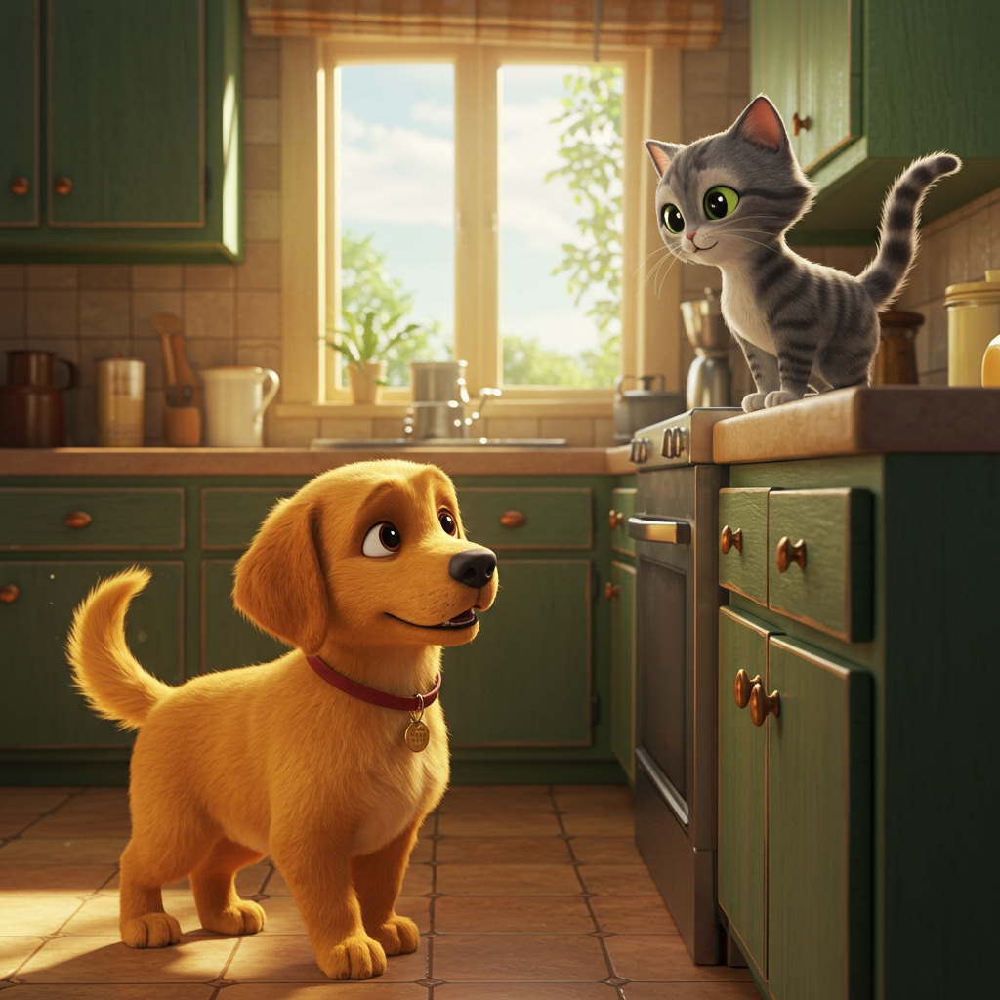

Please use one of the more specific methods: `send_client_content`, `send_realtime_input`, or `send_tool_response` instead.
  await session.send(input=api_text, end_of_turn=True)



Processing scene 1:
Image Prompt: The living room. Whiskers bats at Patches' nose with a paw. Patches playfully dodges, ears flopping.
Audio Text: Whiskers loved to tease Patches, and Patches loved to play along.
Character Description: Patches: golden retriever puppy, Pixar style, floppy ears. Whiskers: gray tabby kitten, Pixar style, playful paws, a mischievous glint in her green eyes.
--------------------------------


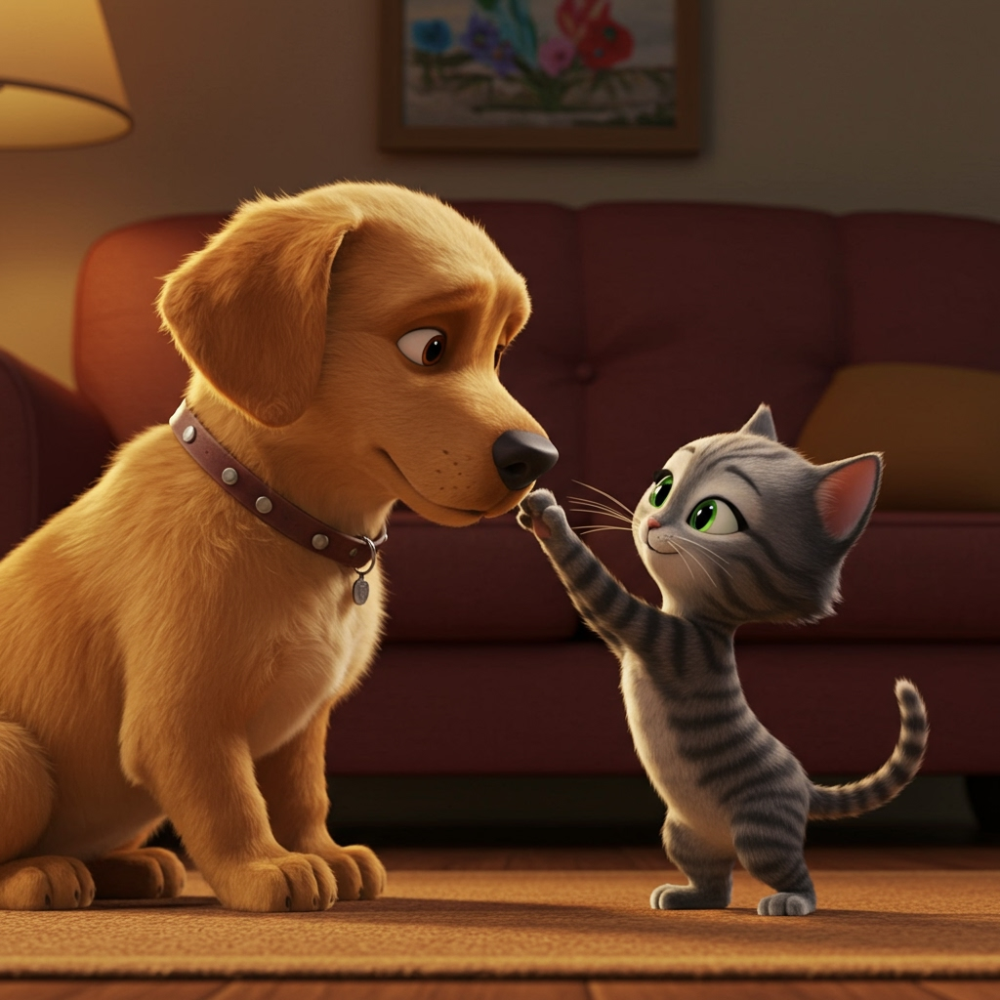

Processing scene 2:
Image Prompt: The backyard. Patches chases his tail in circles. Whiskers watches from a cozy sunbeam on the porch.
Audio Text: Sometimes, Whiskers just liked to observe Patches' silly antics from afar.
Character Description: Patches: golden retriever puppy, Pixar style, bushy tail. Whiskers: gray tabby kitten, Pixar style, content and relaxed, enjoying the warm sunshine.
--------------------------------


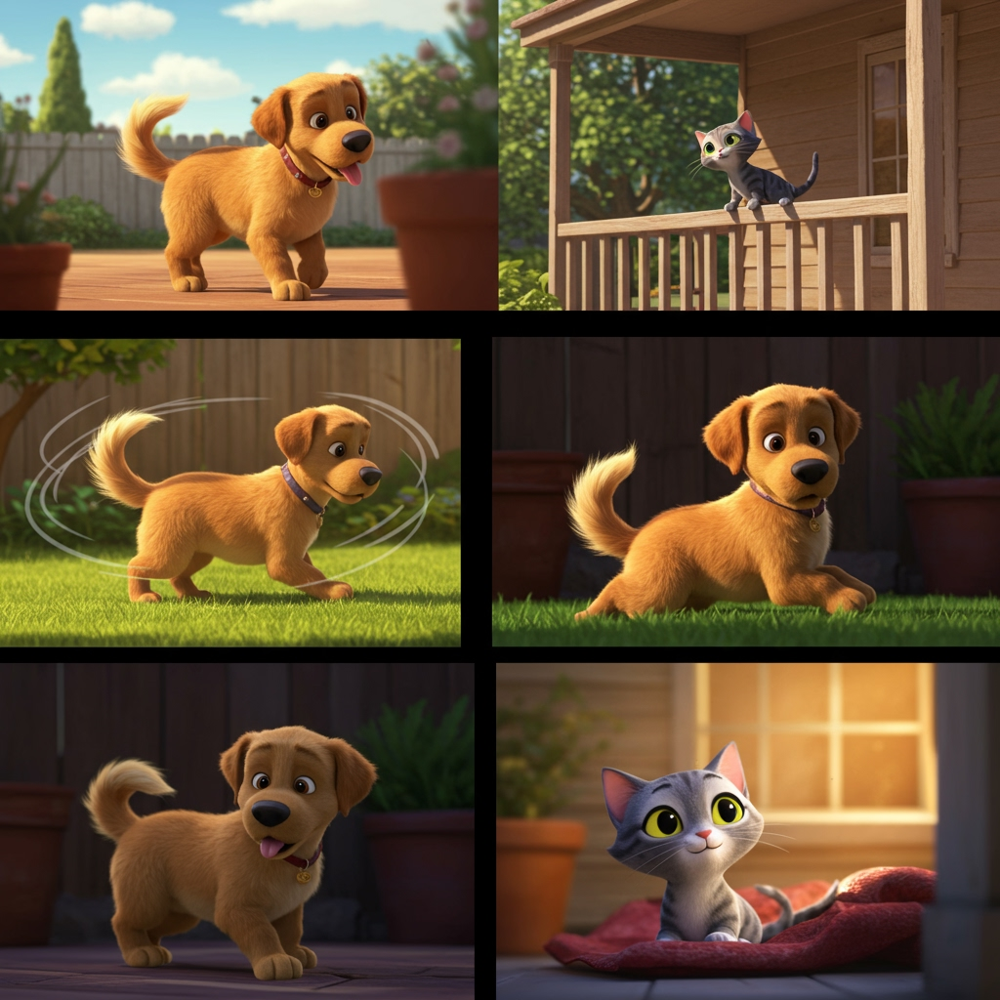

Processing scene 3:
Image Prompt: Close-up on Patches and Whiskers sharing a water bowl. They lap up water side-by-side.
Audio Text: Sharing was caring, especially when it came to the water bowl after a good play.
Character Description: Patches: golden retriever puppy, Pixar style, wet nose. Whiskers: gray tabby kitten, Pixar style, tiny pink tongue, whiskers twitching with contentment.
--------------------------------


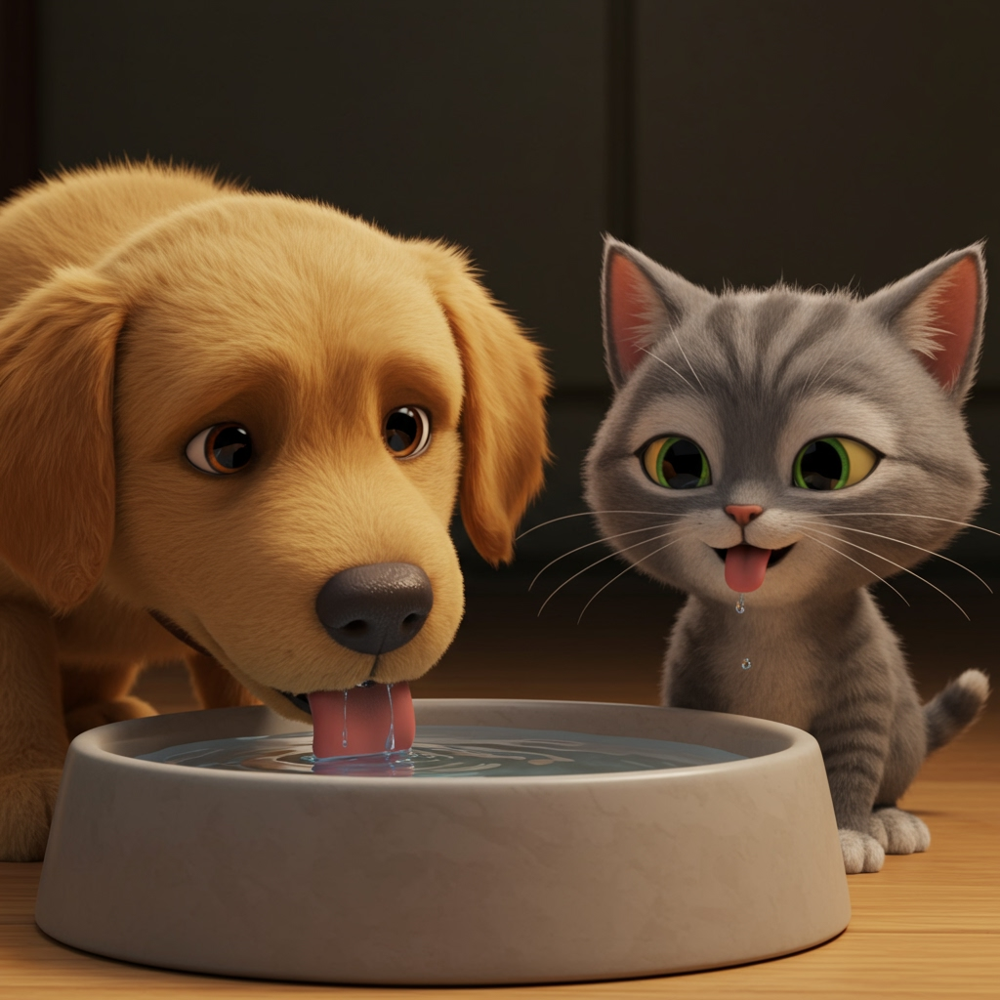

Processing scene 4:
Image Prompt: The bedroom. Whiskers curls up on Patches' back as he lies on his dog bed. Both are sleeping peacefully.
Audio Text: A warm, furry bed made even better by a purring friend.
Character Description: Patches: golden retriever puppy, Pixar style, deeply asleep. Whiskers: gray tabby kitten, Pixar style, curled up, a small, contented purr audible.
--------------------------------


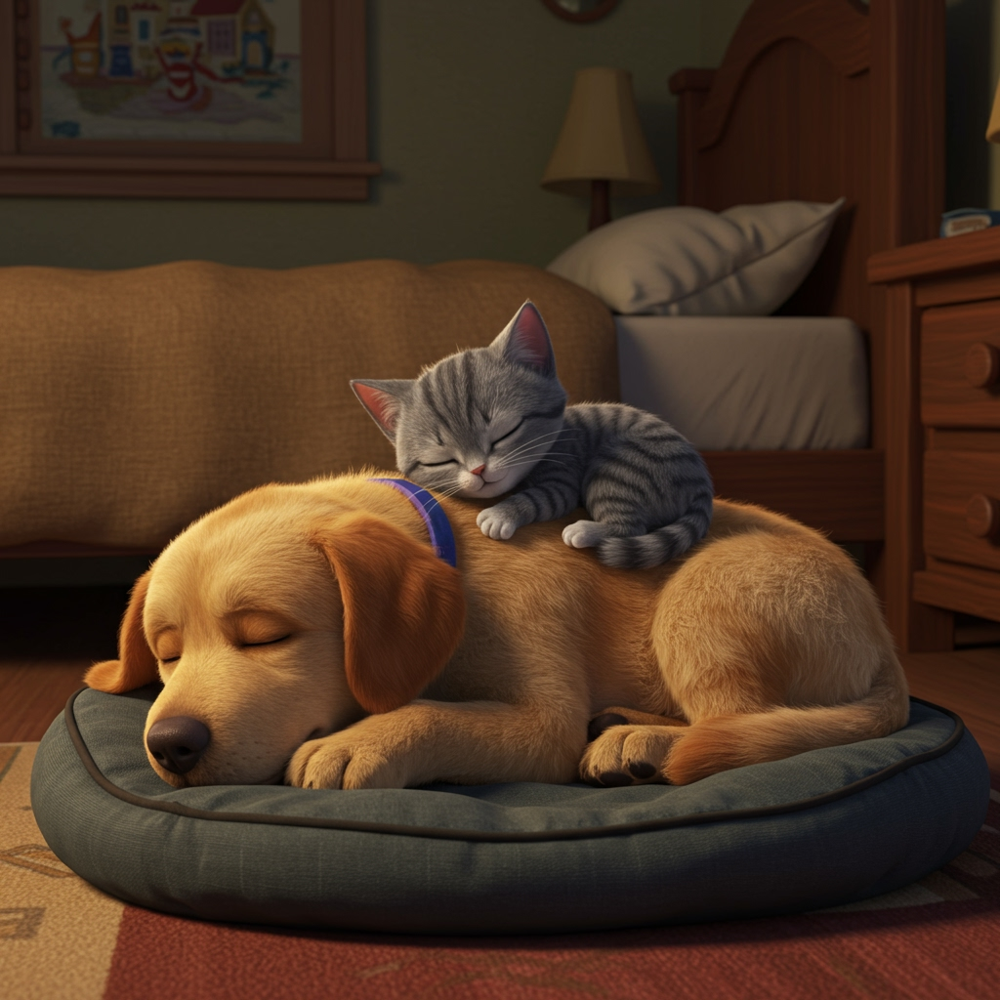

Processing scene 5:
Image Prompt: Outdoor, snow falling. Patches and Whiskers are playing together, Patches jumps around happily in snow, Whiskers jumps on his head.
Audio Text: First snow! Time for Patches and Whiskers to play toghether!
Character Description: Patches: golden retriever puppy, Pixar style, snow on nose. Whiskers: gray tabby kitten, Pixar style, excited. Background is soft and inviting
--------------------------------


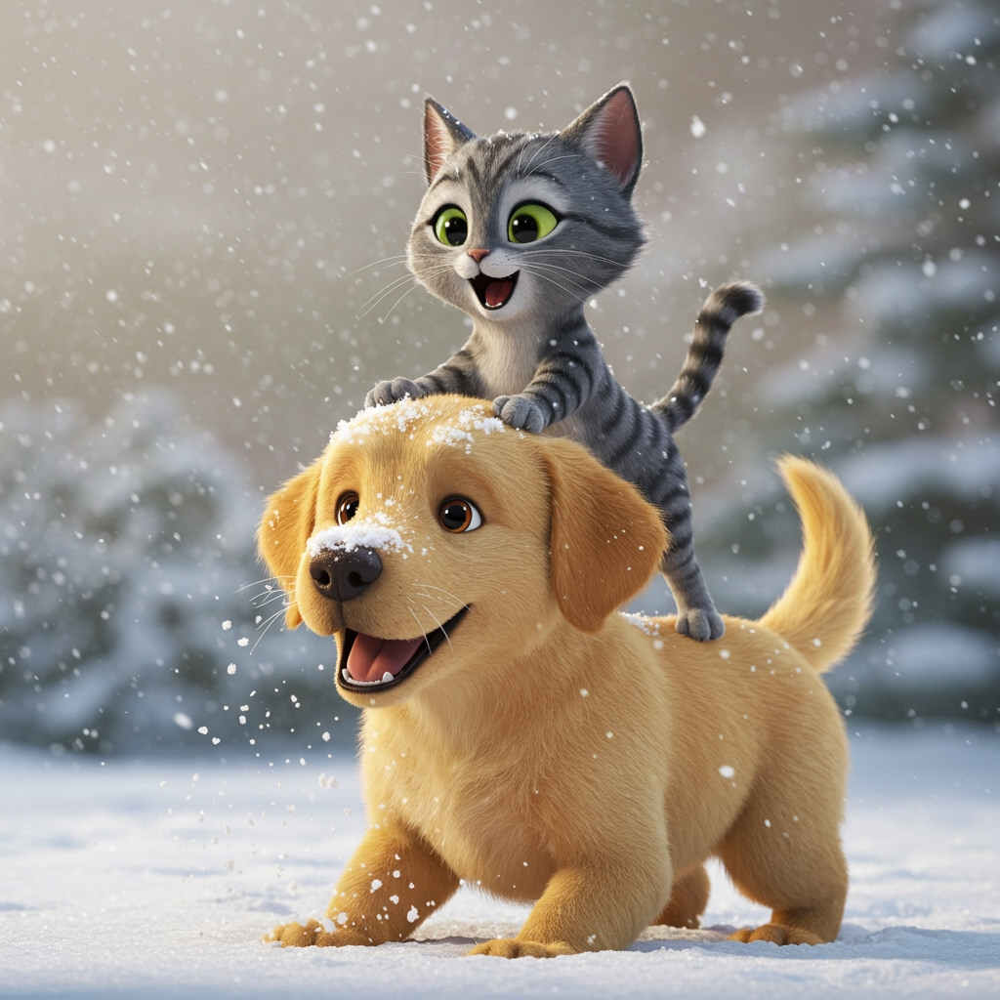

Processing scene 6:
Image Prompt: Patches is looking up a tall tree. Whiskers is meowing from the top of the tree.
Audio Text: Uh oh, Whiskers is in trouble! How will Patches help his bestfriend?
Character Description: Patches: golden retriever puppy, Pixar style, concerned look. Whiskers: gray tabby kitten, Pixar style, scared. Tree is tall.
--------------------------------


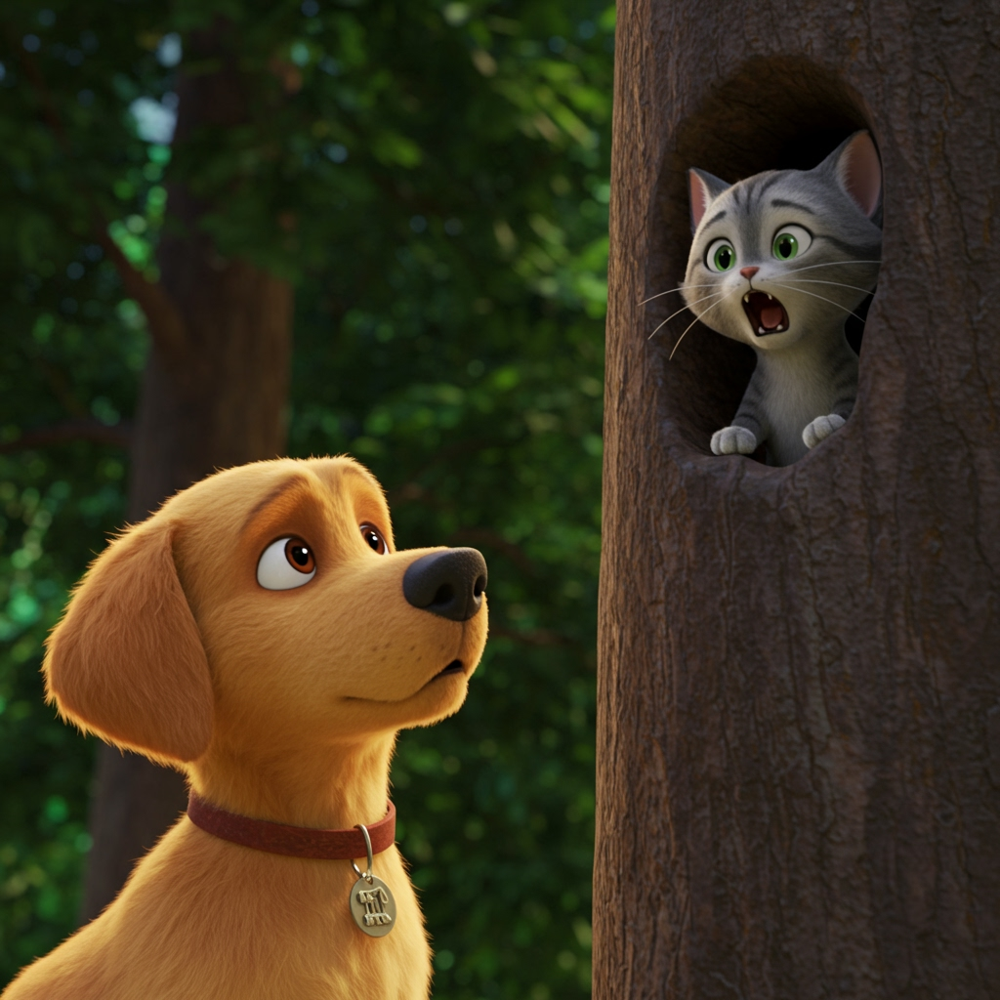

Processing scene 7:
Image Prompt: Night scene, Patches and Whiskers are sleeping together in a dog house, looking up the sky. Many stars.
Audio Text: After all the adventures, Patches and Whiskers sleep together watching the shiny stars.
Character Description: Patches: golden retriever puppy, Pixar style, dreaming. Whiskers: gray tabby kitten, Pixar style, warm and cozy.
--------------------------------


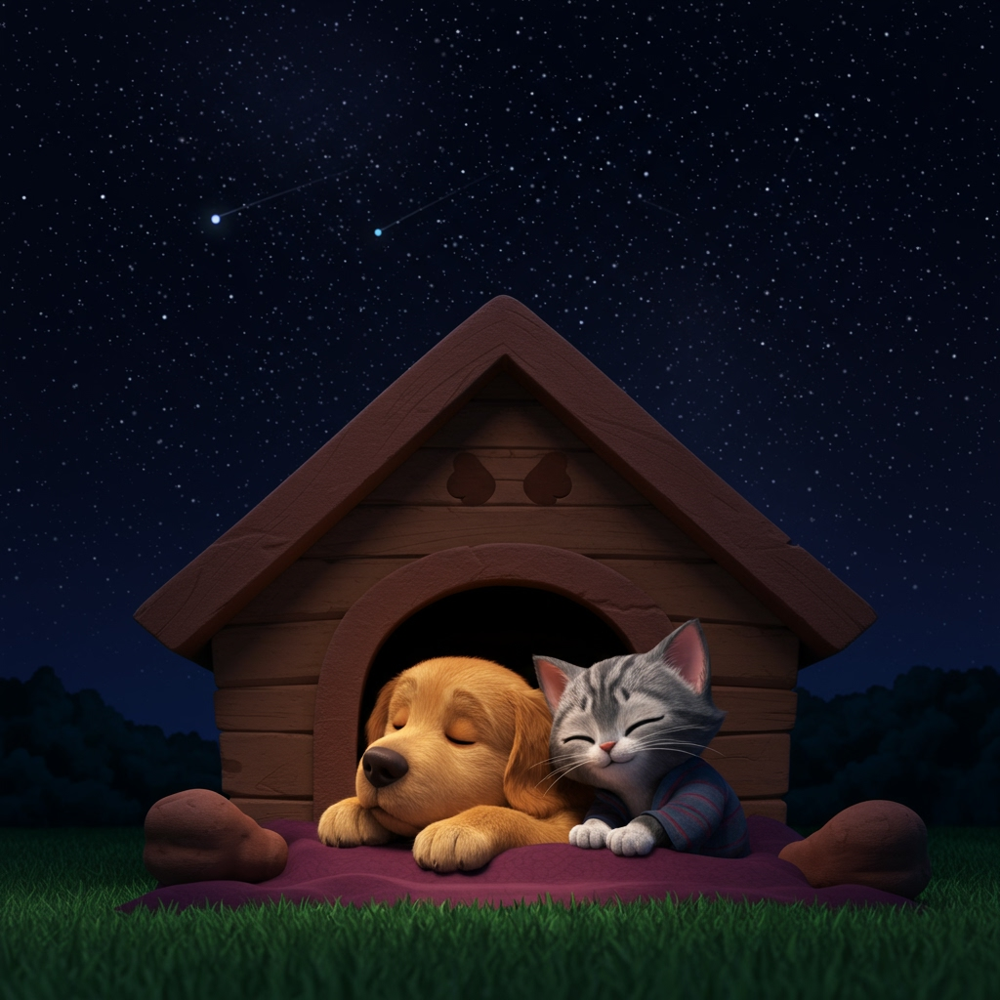

In [ ]:
# --- Cell 3: Main processing loop ---
for i, segment in enumerate(story_segments):
    # Retrieve details for the current scene.
    image_prompt = segment['image_prompt']
    audio_text =  audio_negative_prompt + segment['audio_text']
    audio_text_prompt = segment['audio_text']
    char_desc = segment['character_description']
    print(f"Processing scene {i}:")
    print("Image Prompt:", image_prompt)
    print("Audio Text:", audio_text_prompt)
    print("Character Description:", char_desc)
    print("--------------------------------")

    # -------------------------
    # Image Generation using Google Imagen
    # -------------------------
    combined_prompt = "detailed ghibili animation style " + image_prompt + " " + char_desc

    result = client.models.generate_images(
        model=IMAGE_MODEL_ID,
        prompt=combined_prompt,
        config={
            "number_of_images": 1,
            "output_mime_type": "image/jpeg",
            "person_generation": "DONT_ALLOW",
            "aspect_ratio": "1:1"
        }
    )

    try:
        if not result.generated_images:
            raise ValueError("No images were generated. The prompt might have been flagged as harmful. Please modify your prompt and try again.")
        for generated_image in result.generated_images:
            image = Image.open(BytesIO(generated_image.image.image_bytes))
    except Exception as e:
        print("Image generation failed ", e)

    image_path = f"image_{i}.png"
    image.save(image_path)
    temp_image_files.append(image_path)
    display(image)

    # -------------------------
    # Audio Generation using Google Live API
    # -------------------------
    audio_path = f"audio_{i}.wav"
    audio_path = generate_audio_live(audio_text, audio_path)
    temp_audio_files.append(audio_path)


    # -------------------------
    # Create Video Clip (Image + Audio)
    # -------------------------
    audio_clip = AudioFileClip(audio_path)

    # Convert PIL Image to numpy array
    np_image = np.array(image)

    # Create ImageClip (size is inferred from np_image)
    image_clip = ImageClip(np_image).set_duration(audio_clip.duration)

    # Store composite clip with audio in memory
    composite_clip = CompositeVideoClip([image_clip]).set_audio(audio_clip)
    video_clips.append(composite_clip)

In [ ]:
final_video = concatenate_videoclips(video_clips)
output_filename = f"{int(time.time())}_output_video.mp4"
print("Writing final video to", output_filename)
final_video.write_videofile(output_filename, fps=24)

# Display the video in the notebook
def show_video(video_path):
    """Display video in notebook"""
    video_file = open(video_path, "rb")
    video_bytes = video_file.read()
    video_b64 = b64encode(video_bytes).decode()
    video_tag = f'<video width="640" height="480" controls><source src="data:video/mp4;base64,{video_b64}" type="video/mp4"></video>'
    return HTML(video_tag)

# Show the video
display(show_video(output_filename))

# Cleanup: Close video clips and remove temporary files
final_video.close()
for clip in video_clips:
    clip.close()
for file in temp_audio_files:
    os.remove(file)
for file in temp_image_files:
    os.remove(file)


# A video player will appear below

Writing final video to 1747401925_output_video.mp4
Moviepy - Building video 1747401925_output_video.mp4.
MoviePy - Writing audio in 1747401925_output_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video 1747401925_output_video.mp4



Moviepy - Done !
Moviepy - video ready 1747401925_output_video.mp4
